In [3]:
# -*- coding: utf-8 -*-
"""
Created on Tue May 09 22:40:55 2017

@author: smart
"""
# Till: 10th May EnergyLA and other energy's were for all frames
# After 10th maximum is taken  
import numpy as np
import sys,json
import pprint
import os
#sys.path.insert(0,'/root/anaconda2/lib/python2.7/site-packages')
import pandas as pd
import os

#directory = "unVcorrAB\\Read_File"
#==============================================================================
# root ="C:\Users\WSNLab\Wireless_sensor_network_light\\"
# directory = root + "\\Abhimanyu"
#==============================================================================
max_sum_energy_flag=0

root = "C:\\Users\\Smart\\Downloads\\"
directory = root + "read_files_mog_new"
#root="C:\\Users\\smart\\Dropbox\\Abhimanyu\\Algorithm_Comparison\\Matlab_Code\\Matlab_All_Codes\\Camera_Analysis"

#directory = "C:\\Users\\WSNLab\\Dropbox_Tarun\\Dropbox\\Abhimanyu\\Algorithm_Comparison\\Matlab_Code\\Matlab_All_Codes\\Camera_Analysis\\Read_File"
count_value = 0
count_class = []
Energy_2D_array = []
for file in os.listdir(directory):
    if file.endswith(".one"):
        file_name = os.path.join(directory, file)
        f=open(file_name,'r')
        count=0  
        def energy(disp,features,max_sum_energy_flag):
            disp=features[disp]
            disp = np.asarray(disp)
            dist = disp.copy()
            if max_sum_energy_flag==1:
                Energy = np.max(np.sum(dist*dist,axis=0))
            else:
                Energy = np.sum(dist*dist)
                
                
            return Energy

        while 1:
            line=f.readline().strip()
            if not line:break
            features=json.loads(line)
            keylist = features.keys()
            keys_sort = keylist.sort()
            #print 'keys' + str(keys_sort)
#            raw_input()
            #BGSubFeat  = features['BGSubFeat']
            #BGSubFeat_frame_8_sum_max=0
            #for frame in range(0,len(BGSubFeat)):
                #print len(BGSubFeat)
#                raw_input()
            #    BGSubFeat_frame = BGSubFeat[frame]
            #    BGSubFeat_frame_8 = [BGSubFeat_frame['sliceELA'], BGSubFeat_frame['sliceELB'], BGSubFeat_frame['sliceELC'], BGSubFeat_frame['sliceELD'],BGSubFeat_frame['sliceERA'],BGSubFeat_frame['sliceERB'],BGSubFeat_frame['sliceERC'],BGSubFeat_frame['sliceERD']]
            #    BGSubFeat_frame_8_sum=sum(BGSubFeat_frame_8)
            #    if BGSubFeat_frame_8_sum > BGSubFeat_frame_8_sum_max:
            #        BGSubFeat_frame_8_sum_max=BGSubFeat_frame_8_sum
            #        BGSubFeat_frame_8_max=BGSubFeat_frame_8
            ########################################################MOG Features###############################################
            ##############Best Energy Values
            Mog_feature_extract  = features['MOGFeat']
            Mog_feature_extraction_8_sum_max=0
            moglistELA = []
            moglistELB = []
            moglistELC = []
            moglistELD = []
            moglistERA = []
            moglistERB = []
            moglistERC = []
            moglistERD = []
              
            for frame in range(0,len(Mog_feature_extract)):
                Mog_feature_extract_frame = Mog_feature_extract[frame]
                Mog_feature_extraction_8 = [Mog_feature_extract_frame['sliceELA'], Mog_feature_extract_frame['sliceELB'], Mog_feature_extract_frame['sliceELC'], Mog_feature_extract_frame['sliceELD'],Mog_feature_extract_frame['sliceERA'],Mog_feature_extract_frame['sliceERB'],Mog_feature_extract_frame['sliceERC'],Mog_feature_extract_frame['sliceERD']]
                moglistELA.append(Mog_feature_extract_frame['sliceELA'])
                moglistELB.append(Mog_feature_extract_frame['sliceELB'])
                moglistELC.append(Mog_feature_extract_frame['sliceELC'])
                moglistELD.append(Mog_feature_extract_frame['sliceELD'])
                moglistERA.append(Mog_feature_extract_frame['sliceERA'])
                moglistERB.append(Mog_feature_extract_frame['sliceERB'])
                moglistERC.append(Mog_feature_extract_frame['sliceERC'])
                moglistERD.append(Mog_feature_extract_frame['sliceERD'])
        
                Mog_feature_extraction_8_sum=sum(Mog_feature_extraction_8)
                if Mog_feature_extraction_8_sum > Mog_feature_extraction_8_sum_max:
                    Mog_feature_extraction_8_sum_max=Mog_feature_extraction_8_sum
                    Mog_feature_extraction_8_max=Mog_feature_extraction_8
            #####################Energy Values across different Frames
            Mog_feature_extraction_8_max_individual_for_each_case = [max(moglistELA),max(moglistELB),max(moglistELC),max(moglistELD),max(moglistERA),max(moglistERB),max(moglistERC),max(moglistERD)]
#=============================================================================       
#             dispLA=features['dispLA']
#             dispLA = np.asarray(dispLA)
#             distLA = dispLA.copy()
#             EnergyLA = np.sum(distLA*distLA)
#==============================================================================
            '''
            EnergyLA = energy('dispLA',features,max_sum_energy_flag)
            EnergyRA = energy('dispRA',features,max_sum_energy_flag)
            EnergyLB = energy('dispLB',features,max_sum_energy_flag)
            EnergyRB = energy('dispRB',features,max_sum_energy_flag)
            EnergyLC = energy('dispLC',features,max_sum_energy_flag)
            EnergyRC = energy('dispRC',features,max_sum_energy_flag)
            EnergyLD = energy('dispLD',features,max_sum_energy_flag)
            EnergyRD = energy('dispRD',features,max_sum_energy_flag)
            unVcorrAB = max(features['unVcorrAB'])
            unVcorrCD = max(features['unVcorrCD'])
            Energy_array= np.asarray([EnergyLA, EnergyRA, EnergyLB, EnergyRB, EnergyLC, EnergyRC, EnergyLD, EnergyRD,unVcorrAB,unVcorrCD])
            Energy_array=np.append(Energy_array,BGSubFeat_frame_8_max)
            '''
            mog_array = np.append(Mog_feature_extraction_8_max,Mog_feature_extraction_8_max_individual_for_each_case)
            Energy_2D_array.append(mog_array)
            #print 'count' + str(count)
            count=count+1   
    count_class.append(sum(np.full((count,1),count_value).tolist(),[]))
    count_value = count_value + 1    
count_class_value = sum(count_class,[])    
df = pd.DataFrame(Energy_2D_array)
df['class_labels'] = count_class_value
if   max_sum_energy_flag==1:
    str_save="\\Feature_finall_combined_unVAB_CD_background_max_sum_energy"
else:
    str_save="\\Feature_finall_Mog_features"

    
excel_file= root + str_save + ".xlsx"
writer = pd.ExcelWriter(excel_file, engine='xlsxwriter')
#writer = pd.ExcelWriter('C:\\Users\\WSNLab\\Dropbox_Tarun\\Dropbox\\Abhimanyu\\Algorithm_Comparison\\Matlab_Code\\Matlab_All_Codes\\Camera_Analysis\\Feature_finall_combined_unVAB_CD.xlsx', engine='xlsxwriter')
df.to_excel(writer, sheet_name='Sheet1')
writer.save()
writer.close()

C:\Users\smart\Anaconda2\lib\site-packages\numpy\core\numeric.py:301: FutureWarning: in the future, full((61, 1), 1) will return an array of dtype('int32')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)
C:\Users\smart\Anaconda2\lib\site-packages\numpy\core\numeric.py:301: FutureWarning: in the future, full((79, 1), 2) will return an array of dtype('int32')
  format(shape, fill_value, array(fill_value).dtype), FutureWarning)


ValueError: Length of values does not match length of index

In [16]:
A = [1020, 1530, 1274, 1020, 1275, 2294, 3311, 3825, 4329, 6108, 5854, 4330, 5094, 4832, 6871, 4333, 2549, 4845, 4588, 1785, 1784, 255, 1020, 510, 510, 1785, 2548, 254, 1785, 1274, 1275, 1529, 2550, 1785, 255, 255, 0, 255, 510, 0, 765, 255, 765, 255, 0, 0, 255, 255, 1020, 255, 2548, 1020, 1530, 1275, 1530, 510, 765, 255, 510, 1529, 1019, 1019, 5352, 2293, 1785, 510, 764, 510, 510, 0, 0, 255, 255, 0, 1526, 255, 0, 1530, 0, 255, 1275, 510, 765, 510, 255, 255, 2039, 255, 255, 510, 0, 1020, 0, 1020, 765, 3059, 2548, 2802, 4585, 3564, 2548, 3059, 3315, 3058, 2291, 765, 255, 761, 510, 13755, 19609, 70038, 57947, 69949, 53931, 43907, 16546, 22377, 9162, 1020, 510, 255, 1020, 255, 255, 765, 255, 1020, 255, 0, 0, 255, 0, 0, 510, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2039, 4076, 1528]
max(A)

70038

In [2]:
from keras.utils import np_utils
from keras.layers.core import Dense, Activation, Dropout
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution2D, MaxPooling2D
from keras.optimizers import SGD

Using TensorFlow backend.


ImportError: No module named tensorflow

In [8]:
import keras
keras.backend.backend()

Using Theano backend.



You can find the C code in this temporary file: c:\users\smart\appdata\local\temp\theano_compilation_error_me1sc3


Exception: Compilation failed (return status=1): In file included from C:/Program Files/mingw-w64/x86_64-6.3.0-posix-seh-rt_v5-rev1/mingw64/lib/gcc/x86_64-w64-mingw32/6.3.0/include/c++/math.h:36:0,.                  from C:\Users\smart\Anaconda2\include/pyport.h:325,.                  from C:\Users\smart\Anaconda2\include/Python.h:58,.                  from C:\Users\smart\AppData\Local\Theano\compiledir_Windows-7-6.1.7600-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-2.7.13-64\lazylinker_ext\mod.cpp:1:. C:/Program Files/mingw-w64/x86_64-6.3.0-posix-seh-rt_v5-rev1/mingw64/lib/gcc/x86_64-w64-mingw32/6.3.0/include/c++/cmath:1157:11: error: '::hypot' has not been declared.    using ::hypot;.            ^~~~~. 

In [3]:
import keras



Using Theano backend.


ImportError: cannot import name gof

In [1]:
import theano

In [1]:
import keras
import theano
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
import numpy as np
directory_train = "C:\\Users\\smart\\Dropbox\\Abhimanyu\\Algorithm_Comparison\\Matlab_Code\\Matlab_All_Codes\\Chirplet\\"
file_name_train = "chirplet_IC_tiger_dc_there_new_20_May_2017_tiger_dc_indices_from_PCA.xlsx"
directory_test = "C:\\Users\\smart\\Dropbox\\Abhimanyu\\Algorithm_Comparison\\Matlab_Code\\Matlab_All_Codes\\Chirplet\\"
file_name_test = "chirplet_IC_tiger_dc_there_new_20_May_2017_tiger_dc_indices_from_PCA.xlsx"
featureDimension = 62
accuracy_all = []
confusion_matrix_sum_all = [] 
count_even = 0;
count_odd = 1;
precision_all = []
recall_all = []
f1score_all = []
val_train = pd.read_excel(directory_train+file_name_train,sheetname=0)
val_test  = pd.read_excel(directory_test+file_name_test,sheetname=1)
######################################################################################################
val_data_train = val_train.iloc[:,2:featureDimension]
val_label_train = val_train.iloc[:,1]
val_data_test = val_test.iloc[:,2:featureDimension]
val_label_test = val_test.iloc[:,1]
train_data = np.array(val_data_train)
train_labels = list(val_label_train)  
print train_labels
test_data = np.array(val_data_test)
test_labels = list(val_label_test)        
print test_labels
#train_data = np.reshape(train_data,(262*2,))
X = train_data
Y = train_labels
batch_size = 60
#train_labels = train_labels.reshape((-1, 1))
#test_labels = test_labels.reshape((-1,1))
one_hot_labels = keras.utils.to_categorical(train_labels, num_classes=3)
one_hot_labels_test = keras.utils.to_categorical(test_labels, num_classes=3)
print one_hot_labels
print one_hot_labels_test
# create model
model = Sequential()
model.add(Dense(12, input_dim=featureDimension-2, init='uniform', activation='relu'))
model.add(Dense(8, init='uniform', activation='relu'))
model.add(Dense(3))
# Compile model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print model.summary()
# Fit the model
print(train_data.shape)
model.fit(train_data, one_hot_labels,batch_size=batch_size,epochs=10,validation_data=(train_data, one_hot_labels),verbose=1)
score, acc = model.evaluate(test_data, one_hot_labels_test,
                            batch_size=batch_size,verbose=0)
print('Test score:', score)
print('Test accuracy:', acc)


Using Theano backend.


[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 

C:\Users\smart\Anaconda2\lib\site-packages\ipykernel\__main__.py:44: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(12, activation="relu", kernel_initializer="uniform", input_dim=60)`
C:\Users\smart\Anaconda2\lib\site-packages\ipykernel\__main__.py:45: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="relu", kernel_initializer="uniform")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 12)                732       
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 104       
_________________________________________________________________
dense_3 (Dense)              (None, 3)                 27        
Total params: 863
Trainable params: 863
Non-trainable params: 0
_________________________________________________________________
None
(382L, 60L)
Train on 382 samples, validate on 382 samples
Epoch 1/10
382/382 [==============================] - 0s - loss: 7.0923 - acc: 0.2435 - val_loss: 7.5524 - val_acc: 0.2147
Epoch 2/10
382/382 [==============================] - 0s - loss: 7.4109 - acc: 0.2173 - val_loss: 7.2851 - val_acc: 0.1911
Epoch

In [33]:
train_labels

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,


In [34]:
one_hot_labels

NameError: name 'one_hot_labels' is not defined

In [14]:
from keras.layers import Input, Dense
from keras.models import Model
import keras
import theano
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
import numpy as np
directory_train = "C:\\Users\\smart\\Dropbox\\Abhimanyu\\Algorithm_Comparison\\Matlab_Code\\Matlab_All_Codes\\Chirplet\\"
file_name_train = "chirplet_IC_tiger_dc_there_new_20_May_2017_tiger_dc_indices_from_PCA.xlsx"
directory_test = "C:\\Users\\smart\\Dropbox\\Abhimanyu\\Algorithm_Comparison\\Matlab_Code\\Matlab_All_Codes\\Chirplet\\"
file_name_test = "chirplet_IC_tiger_dc_there_new_20_May_2017_tiger_dc_indices_from_PCA.xlsx"
featureDimension = 62
accuracy_all = []
confusion_matrix_sum_all = [] 
count_even = 0;
count_odd = 1;
precision_all = []
recall_all = []
f1score_all = []
val_train = pd.read_excel(directory_train+file_name_train,sheetname=8)
val_test  = pd.read_excel(directory_test+file_name_test,sheetname=9)
######################################################################################################
val_data_train = val_train.iloc[:,2:featureDimension]
val_label_train = val_train.iloc[:,1]
val_data_test = val_test.iloc[:,2:featureDimension]
val_label_test = val_test.iloc[:,1]
train_data = np.array(val_data_train)
train_labels = list(val_label_train)  
print train_labels
test_data = np.array(val_data_test)
test_labels = list(val_label_test)        
print test_labels
#train_data = np.reshape(train_data,(262*2,))
X = train_data
Y = train_labels
batch_size = 60
#train_labels = train_labels.reshape((-1, 1))
#test_labels = test_labels.reshape((-1,1))
one_hot_labels = keras.utils.to_categorical(train_labels, num_classes=3)
one_hot_labels_test = keras.utils.to_categorical(test_labels, num_classes=3)
# This returns a tensor
inputs = Input(shape=(60,))

# a layer instance is callable on a tensor, and returns a tensor
x = Dense(64, activation='linear')(inputs)
x = Dense(64, activation='relu')(x)
x = Dense(64, activation='linear')(x)
predictions = Dense(3, activation='softmax')(x)

# This creates a model that includes
# the Input layer and three Dense layers
model = Model(inputs=inputs, outputs=predictions)
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_data, one_hot_labels,batch_size=batch_size,epochs=5,validation_data=(train_data, one_hot_labels))  # starts training
score, acc = model.evaluate(test_data, one_hot_labels_test,batch_size=batch_size,verbose=0)
print('Test score:', score)
print('Test accuracy:', acc)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 

In [163]:
########Working scenario
from keras.layers import Input, Dense
from keras.models import Model
import keras
import theano
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
import numpy as np
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.layers.convolutional import Conv1D,Conv2D
from keras.layers import MaxPooling1D
from keras.optimizers import SGD,Adagrad,Adadelta,Adam,Adamax
import numpy as np
np.random.seed(1337) # for reproducibility
directory_train = "D:\\PIL\\"
file_name_train = "deep_input_check_small_child_740_features.xlsx"
directory_test = "D:\\PIL\\"
file_name_test = "deep_input_check_small_child_740_features.xlsx"
featureDimension = 2961
accuracy_all = []
confusion_matrix_sum_all = [] 
count_even = 0;
count_odd = 1;
precision_all = []
recall_all = []
f1score_all = []
val_train = pd.read_excel(directory_train+file_name_train,sheetname=0)
val_test  = pd.read_excel(directory_test+file_name_test,sheetname=1)
######################################################################################################
val_data_train = val_train.iloc[:,1:featureDimension]
val_label_train = val_train.iloc[:,0]
val_data_test = val_test.iloc[:,1:featureDimension]
val_label_test = val_test.iloc[:,0]
train_data = np.array(val_data_train)
train_labels = list(val_label_train)  
#print train_labels
test_data = np.array(val_data_test)
test_labels = list(val_label_test)        
#print test_labels
#train_data = np.reshape(train_data,(262*2,))
X = train_data
number_of_features_one_class = 740
train_data = np.reshape(train_data,(len(train_data),4,number_of_features_one_class))
test_data = np.reshape(test_data,(len(test_data),4,number_of_features_one_class))
print np.shape(X)
Y = train_labels
batch_size = 25
#train_labels = train_labels.reshape((-1, 1))
#test_labels = test_labels.reshape((-1,1))
one_hot_labels = keras.utils.to_categorical(train_labels, num_classes=2)
one_hot_labels_test = keras.utils.to_categorical(test_labels, num_classes=2)
# This returns a tensor
#inputs = Input(shape=(60,))
model = Sequential()
# a layer instance is callable on a tensor, and returns a tensor
model.add(Conv1D(60, 2,activation='relu', input_shape=(4,number_of_features_one_class)))
model.add(Dropout(0.25))
model.add(Conv1D(60, 2,activation='relu'))
model.add(Dropout(0.25))
model.add(Conv1D(60, 2,activation='relu'))
model.add(MaxPooling1D(pool_size=(1)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
#model.add(Dense(128, activation='relu'))
#model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))
 
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
 

# This creates a model that includes
# the Input layer and three Dense layers
#model = Model(inputs=inputs, outputs=predictions)
model.compile(loss='categorical_crossentropy',
              optimizer='Adadelta',
              metrics=['accuracy'])

model.fit(train_data, one_hot_labels,batch_size=batch_size,epochs=12,validation_data=(train_data, one_hot_labels))  # starts training
score, acc = model.evaluate(test_data, one_hot_labels_test,batch_size=batch_size,verbose=0)
print('Test score:', score)
print('Test accuracy:', acc)
from keras.utils import plot_model
plot_model(model, to_file='model_check_CNN.png')

(2143L, 2960L)
Train on 2143 samples, validate on 2143 samples
Epoch 1/12
2143/2143 [==============================] - 9s - loss: 0.5954 - acc: 0.7084 - val_loss: 0.3681 - val_acc: 0.8591

In [132]:
import numpy as np
np.random.seed(1337)
########Working scenario with the best outcome of 88.42
from keras.layers import Input, Dense
from keras.models import Model
import keras
import theano
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
import numpy as np
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.layers.convolutional import Conv1D,Conv2D
from keras.layers import MaxPooling1D,AveragePooling1D
from keras.optimizers import SGD,Adagrad,Adadelta,Adam,Adamax,Nadam,rmsprop

directory_train = "D:\\PIL\\"
file_name_train = "deep_input_check.xlsx"
directory_test = "D:\\PIL\\"
file_name_test = "deep_input_check.xlsx"
featureDimension = 4778

accuracy_all = []
confusion_matrix_sum_all = [] 
count_even = 0;
count_odd = 1;
precision_all = []
recall_all = []
f1score_all = []
val_train = pd.read_excel(directory_train+file_name_train,sheetname=0)
val_test  = pd.read_excel(directory_test+file_name_test,sheetname=1)
######################################################################################################
val_data_train = val_train.iloc[:,1:featureDimension]
val_label_train = val_train.iloc[:,0]
val_data_test = val_test.iloc[:,1:featureDimension]
val_label_test = val_test.iloc[:,0]
train_data = np.array(val_data_train)
train_labels = list(val_label_train)  
#print train_labels
test_data = np.array(val_data_test)
test_labels = list(val_label_test)  
print test_labels[0]
print test_labels[1]
print len(test_labels)
for i in range(len(test_labels)):
    if(test_labels[i]== 1):
        test_labels[i]=0
for i in range(len(train_labels)):
    if(train_labels[i]== 1):
        train_labels[i]=0
for i in range(len(test_labels)):
    if(test_labels[i]== 2):
        test_labels[i]=1
for i in range(len(train_labels)):
    if(train_labels[i]== 2):
        train_labels[i]=1
           
#print test_labels
#train_data = np.reshape(train_data,(262*2,))
X = train_data
train_data = np.reshape(train_data,(len(train_data),4,1194))
test_data = np.reshape(test_data,(len(test_data),4,1194))
print np.shape(X)
Y = train_labels
batch_size = 10
#train_labels = train_labels.reshape((-1, 1))
#test_labels = test_labels.reshape((-1,1))
#print train_labels
one_hot_labels = keras.utils.to_categorical(train_labels, num_classes=2)
one_hot_labels_test = keras.utils.to_categorical(test_labels, num_classes=2)
# This returns a tensor
#inputs = Input(shape=(60,))
model = Sequential()
# a layer instance is callable on a tensor, and returns a tensor
model.add(Conv1D(60, 2,activation='relu', input_shape=(4,1194)))
model.add(Dropout(0.5))
model.add(Conv1D(60, 2,activation='relu'))
model.add(Dropout(0.5))
model.add(Conv1D(60, 2,activation='relu'))
model.add(AveragePooling1D(pool_size=(1)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
#model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))
 
sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
 

# This creates a model that includes
# the Input layer and three Dense layers
#model = Model(inputs=inputs, outputs=predictions)
model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

model.fit(train_data, one_hot_labels,batch_size=batch_size,epochs=30,validation_data=(train_data, one_hot_labels))  # starts training
score, acc = model.evaluate(test_data, one_hot_labels_test,batch_size=batch_size,verbose=0)
print('Test score:', score)
print('Test accuracy:', acc)
from keras.utils import plot_model
plot_model(model, to_file='model_check_CNN.png')

1
1
95
(383L, 4776L)
Train on 383 samples, validate on 383 samples
Epoch 1/30
383/383 [==============================] - 1s - loss: 0.7702 - acc: 0.6867 - val_loss: 0.4567 - val_acc: 0.7363

In [198]:
import numpy as np
np.random.seed(1337)
########Working scenario with the best outcome of 92.63 freezed as the accuracy
from keras.layers import Input, Dense
from keras.models import Model
import keras
import theano
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
import numpy as np
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.layers.convolutional import Conv1D,Conv2D
from keras.layers import MaxPooling1D
from keras.optimizers import SGD,Adagrad,Adadelta,Adam,Adamax,Nadam,rmsprop

directory_train = "D:\\PIL\\"
file_name_train = "deep_input_check.xlsx"
directory_test = "D:\\PIL\\"
file_name_test = "deep_input_check.xlsx"
featureDimension = 4778

accuracy_all = []
confusion_matrix_sum_all = [] 
count_even = 0;
count_odd = 1;
precision_all = []
recall_all = []
f1score_all = []
val_train = pd.read_excel(directory_train+file_name_train,sheetname=0)
val_test  = pd.read_excel(directory_test+file_name_test,sheetname=1)
######################################################################################################
val_data_train = val_train.iloc[:,1:featureDimension]
val_label_train = val_train.iloc[:,0]
val_data_test = val_test.iloc[:,1:featureDimension]
val_label_test = val_test.iloc[:,0]
train_data = np.array(val_data_train)
train_labels = list(val_label_train)  
#print train_labels
test_data = np.array(val_data_test)
test_labels = list(val_label_test)  
print test_labels[0]
print test_labels[1]
print len(test_labels)
for i in range(len(test_labels)):
    if(test_labels[i]== 1):
        test_labels[i]=0
for i in range(len(train_labels)):
    if(train_labels[i]== 1):
        train_labels[i]=0
for i in range(len(test_labels)):
    if(test_labels[i]== 2):
        test_labels[i]=1
for i in range(len(train_labels)):
    if(train_labels[i]== 2):
        train_labels[i]=1
           
#print test_labels
#train_data = np.reshape(train_data,(262*2,))
X = train_data
train_data = np.reshape(train_data,(len(train_data),4,1194))
test_data = np.reshape(test_data,(len(test_data),4,1194))
print np.shape(X)
Y = train_labels
batch_size = 10
#train_labels = train_labels.reshape((-1, 1))
#test_labels = test_labels.reshape((-1,1))
#print train_labels
one_hot_labels = keras.utils.to_categorical(train_labels, num_classes=2)
one_hot_labels_test = keras.utils.to_categorical(test_labels, num_classes=2)
# This returns a tensor
#inputs = Input(shape=(60,))
model = Sequential()
# a layer instance is callable on a tensor, and returns a tensor
model.add(Conv1D(60, 2,activation='relu', input_shape=(4,1194)))
model.add(Dropout(0.5))
model.add(Conv1D(60, 2,activation='relu'))
model.add(Dropout(0.5))
model.add(Conv1D(60, 2,activation='relu'))
model.add(MaxPooling1D(pool_size=(1)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(256, activation='tanh'))
model.add(Dense(128, activation='tanh'))
model.add(Dense(64, activation='tanh'))
#model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))
 
sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
 

# This creates a model that includes
# the Input layer and three Dense layers
#model = Model(inputs=inputs, outputs=predictions)
model.compile(loss='sparse_categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

model.fit(train_data, one_hot_labels,batch_size=batch_size,epochs=10,validation_data=(train_data, one_hot_labels))  # starts training
score, acc = model.evaluate(test_data, one_hot_labels_test,batch_size=batch_size,verbose=0)
print('Test score:', score)
print('Test accuracy:', acc)
from keras.utils import plot_model
plot_model(model, to_file='model_check_CNN.png')

1
1
95
(383L, 4776L)


ValueError: Error when checking target: expected dense_202 to have shape (None, 1) but got array with shape (383L, 2L)

In [74]:
from keras.layers import Input, Dense
from keras.models import Model
import keras
import theano
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
import numpy as np
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.layers import Convolution1D, MaxPooling1D

directory_train = "D:\\PIL\\"
file_name_train = "deep_input_check.xlsx"
directory_test = "D:\\PIL\\"
file_name_test = "deep_input_check.xlsx"
featureDimension = 4778
accuracy_all = []
confusion_matrix_sum_all = [] 
count_even = 0;
count_odd = 1;
precision_all = []
recall_all = []
f1score_all = []
val_train = pd.read_excel(directory_train+file_name_train,sheetname=0)
val_test  = pd.read_excel(directory_test+file_name_test,sheetname=1)
######################################################################################################
val_data_train = val_train.iloc[:,1:featureDimension]
val_label_train = val_train.iloc[:,0]
val_data_test = val_test.iloc[:,1:featureDimension]
val_label_test = val_test.iloc[:,0]
train_data = np.array(val_data_train)
train_labels = list(val_label_train)  
#print train_labels
test_data = np.array(val_data_test)
test_labels = list(val_label_test)        
#print test_labels
#train_data = np.reshape(train_data,(262*2,))
X = train_data
train_data = np.reshape(train_data,(len(train_data),4,1194))
test_data = np.reshape(test_data,(len(test_data),4,1194))

In [77]:
train_data[0]

array([[  32.3804878 ,    6.3804878 ,    0.3804878 , ...,    0.        ,
           0.        ,    0.        ],
       [ -26.35121951,  135.64878049,  201.64878049, ...,    0.        ,
           0.        ,    0.        ],
       [  -5.56341463,  153.43658537,  167.43658537, ...,    0.        ,
           0.        ,    0.        ],
       [  21.98536585,   18.98536585,    5.98536585, ...,    0.        ,
           0.        ,    0.        ]])

In [185]:
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
import numpy as np

model = ResNet50(weights='imagenet')

img_path = 'D:\\PIL\\gun1.jpg'   
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = model.predict(x)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
print('Predicted:', decode_predictions(preds, top=5)[0])
# Predicted: [(u'n02504013', u'Indian_elephant', 0.82658225), (u'n01871265', u'tusker', 0.1122357), (u'n02504458', u'African_elephant', 0.061040461)]

('Predicted:', [(u'n02749479', u'assault_rifle', 0.35362813), (u'n04090263', u'rifle', 0.070599876), (u'n02916936', u'bulletproof_vest', 0.068399362), (u'n03485407', u'hand-held_computer', 0.064182743), (u'n03832673', u'notebook', 0.052557718)])


In [90]:
import cv2
print(cv2.__version__)
vidcap = cv2.VideoCapture('E:\\fast dog slow dog\\high speed dog \\lap2\\lap2_dog1_walk_3m.avi')
success,image = vidcap.read()
count = 0
success = True
while success:
    success,image = vidcap.read()
    print 'Read a new frame: ', success
    cv2.imwrite("D:\\PIL\\Animal_Frames\\frame%d.jpg" % count, image)     # save frame as JPEG file
    count += 1

ImportError: DLL load failed: %1 is not a valid Win32 application.

In [91]:
import cv2

ImportError: DLL load failed: %1 is not a valid Win32 application.

In [2]:
import skvideo.io
videogen = skvideo.io.vread('E:\\fast dog slow dog\\high speed dog \\lap2\\lap2_dog1_walk_3m.avi')
for frame in videogen:
        print(frame.shape)

AssertionError: Cannot find installation of real FFmpeg (which comes with ffprobe).

In [106]:
#################Data Generation Part For Keras

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import numpy
import os
datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        fill_mode='reflect')
root = "F:\\all_crawled_img_data\\all_data_for_different_scenarios\\"
directory = root + "all_data_person crawl0"
count = 0
for file in os.listdir(directory):
    print file
    file_name = os.path.join(directory, file)
    img = load_img(file_name)  
    # this is a PIL image
    x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
    #x = reshape(x,())
    x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)
    #x = numpy.flipud(x)
    # the .flow() command below generates batches of randomly transformed images
    # and saves the results to the `preview/` directory
    i = 0
    #x = numpy.rot90(x,)
    #x = numpy.fliplr(x)
    #flip_p=0.5
    #flip_selector = numpy.random.binomial(1, flip_p, size=(x.shape[0]) == 1)
    #x[flip_selector,:,:,:] = x[flip_selector,:,::-1,:]
    
    for batch in datagen.flow(x, batch_size=1,
                          save_to_dir='F:\\human_crawl_all_images', save_prefix='human'+str(count), save_format='jpg',shuffle=True):
   
   
        i += 1
        if i > 50:
            break  # otherwise the generator would loop indefinitely"""
    count = count + 1        

000001.jpg
000002.jpg
000003.JPG
000004.jpg
000005.jpg
000005.png
000006.jpg
000006.png
000007.jpg
000008.jpg
000009.jpg
000010.jpg
000011.jpeg
000011.jpg
000012.jpg
000013.jpg
000014.jpg


TypeError: float() argument must be a string or a number

In [157]:
#################################GETTING AUGMENTED DATA for human

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import numpy
import os
datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        fill_mode='reflect')
root = "F:\\"
directory = root + "Male"
count = 0
for file in os.listdir(directory):
    #print file
    file_name = os.path.join(directory, file)
    img = load_img(file_name)  
    # this is a PIL image
    x = img_to_array(img)  # this is a Numpy array with shape (3, 150, 150)
    #x = reshape(x,())
    x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)
    #x = numpy.flipud(x)
    # the .flow() command below generates batches of randomly transformed images
    # and saves the results to the `preview/` directory
    i = 0
    #x = numpy.rot90(x,)
    #x = numpy.fliplr(x)
    #flip_p=0.5
    #flip_selector = numpy.random.binomial(1, flip_p, size=(x.shape[0]) == 1)
    #x[flip_selector,:,:,:] = x[flip_selector,:,::-1,:]
    
    for batch in datagen.flow(x, batch_size=1,
                          save_to_dir='F:\\Men', save_prefix='Men'+str(count), save_format='jpg',shuffle=True):
   
   
        i += 1
        if i > 10:
            break  # otherwise the generator would loop indefinitely"""
    count = count + 1        


In [141]:
batch

array([[[[ 142.,  113.,  160.],
         [ 147.,  118.,  165.],
         [ 150.,  129.,  185.],
         ..., 
         [  78.,   85.,   69.],
         [  78.,   85.,   69.],
         [  78.,   85.,   69.]],

        [[ 142.,  113.,  160.],
         [ 147.,  118.,  165.],
         [ 150.,  129.,  185.],
         ..., 
         [  76.,   83.,   67.],
         [  76.,   83.,   67.],
         [  76.,   83.,   67.]],

        [[ 142.,  113.,  160.],
         [ 147.,  118.,  165.],
         [ 150.,  129.,  185.],
         ..., 
         [  75.,   81.,   82.],
         [  75.,   81.,   82.],
         [  75.,   81.,   82.]],

        ..., 
        [[ 167.,  147.,  140.],
         [ 171.,  152.,  154.],
         [ 171.,  152.,  154.],
         ..., 
         [  84.,   80.,   89.],
         [  83.,   83.,   91.],
         [  86.,   86.,   94.]],

        [[ 171.,  152.,  154.],
         [ 166.,  147.,  149.],
         [ 166.,  147.,  149.],
         ..., 
         [  84.,   80.,   89.],
       

In [124]:
import numpy as np
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.wrappers.scikit_learn import KerasClassifier
from keras.constraints import maxnorm
import pandas as pd
import time
from keras.layers import Input, Dense
from keras.models import Model
import keras
import theano
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
import numpy as np
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.layers.convolutional import Conv1D,Conv2D
from keras.layers import MaxPooling1D
from keras.optimizers import SGD,Adagrad,Adadelta,Adam,Adamax,Nadam,rmsprop
# Function to create model, required for KerasClassifier
def create_model(dropout_rate=0.0, weight_constraint=0):
    model = Sequential()
    # a layer instance is callable on a tensor, and returns a tensor
    model.add(Conv1D(60,2,activation='relu', input_shape=(4,1194)))
    model.add(Dropout(0.25))
    model.add(Conv1D(60, 2,activation='relu'))
    model.add(Dropout(0.25))
    model.add(Conv1D(60, 2,activation='relu'))
    model.add(MaxPooling1D(pool_size=(1)))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    #model.add(Dense(128, activation='relu'))
    #model.add(Dropout(0.5))
    model.add(Dense(3, activation='softmax'))
 
    #sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
 

    # This creates a model that includes
    # the Input layer and three Dense layers
    #model = Model(inputs=inputs, outputs=predictions)
    model.compile(loss='categorical_crossentropy',
              optimizer='Adadelta',
              metrics=['accuracy'])
    return model
# fix random seed for reproducibility
def main():
    seed = 7
    np.random.seed(seed)
# load dataset
    directory_train = "D:\\PIL\\"
    file_name_train = "deep_input_check.xlsx"
    directory_test = "D:\\PIL\\"
    file_name_test = "deep_input_check.xlsx"
    featureDimension = 4778
    val_train = pd.read_excel(directory_train+file_name_train,sheetname=0)
    val_test  = pd.read_excel(directory_test+file_name_test,sheetname=1)
    ######################################################################################################
    val_data_train = val_train.iloc[:,1:featureDimension]
    val_label_train = val_train.iloc[:,0]
    val_data_test = val_test.iloc[:,1:featureDimension]
    val_label_test = val_test.iloc[:,0]
    train_data = np.array(val_data_train)
    train_labels = list(val_label_train)  
#print train_labels
    test_data = np.array(val_data_test)
    test_labels = list(val_label_test)        
#print test_labels
#train_data = np.reshape(train_data,(262*2,))
    X = train_data
    train_data = np.reshape(train_data,(len(train_data),4,1194))
    test_data = np.reshape(test_data,(len(test_data),4,1194))
    print np.shape(X)
    Y = train_labels
    batch_size = 10
    one_hot_labels = keras.utils.to_categorical(train_labels, num_classes=3)
# create model
    model = KerasClassifier(build_fn=create_model, epochs=10, batch_size=20, verbose=0)
# define the grid search parameters
    weight_constraint = [1, 2, 3, 4, 5]
    dropout_rate = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    param_grid = dict(dropout_rate=dropout_rate, weight_constraint=weight_constraint)
    grid = GridSearchCV(estimator=model, param_grid=param_grid)
    grid_result = grid.fit(train_data, one_hot_labels)
    # summarize results
    print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
    means = grid_result.cv_results_['mean_test_score']
    stds = grid_result.cv_results_['std_test_score']
    params = grid_result.cv_results_['params']
    for mean, stdev, param in zip(means, stds, params):
        print("%f (%f) with: %r" % (mean, stdev, param))
main()

(383L, 4776L)


ValueError: Error when checking target: expected dense_163 to have shape (None, 3) but got array with shape (128L, 2L)

In [255]:
import os
from sklearn.cross_validation import train_test_split
from PIL import Image
value_input = []
read_directory = "F:\\dog_lR_all_images"
for imgvalue in os.listdir("F:\\dog_lR_all_images"):
    value_input.append(imgvalue)
#Image.close()    
X = y= value_input
print X
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
train_directory = "F:\\dog_lR_all_images_train"
test_directory = "F:\\dog_lR_all_images_test"
for image_train in X_train:
    #print image_train
    img.save(os.path.join(train_directory,image_train))
for image_test in X_test:
    img.save(os.path.join(test_directory,image_test))
#img.close()

['dog0_0_2459.jpeg', 'dog0_0_2862.jpeg', 'dog0_0_2989.jpeg', 'dog0_0_3425.jpeg', 'dog0_0_3725.jpeg', 'dog0_0_3973.jpeg', 'dog0_0_4211.jpeg', 'dog0_0_4441.jpeg', 'dog0_0_4549.jpeg', 'dog0_0_4564.jpeg', 'dog0_0_6715.jpeg', 'dog0_0_6751.jpeg', 'dog0_0_6765.jpeg', 'dog0_0_6782.jpeg', 'dog0_0_7056.jpeg', 'dog0_0_7161.jpeg', 'dog0_0_7243.jpeg', 'dog0_0_7324.jpeg', 'dog0_0_7563.jpeg', 'dog0_0_7656.jpeg', 'dog0_0_7751.jpeg', 'dog0_0_8039.jpeg', 'dog0_0_840.jpeg', 'dog0_0_8413.jpeg', 'dog0_0_8744.jpeg', 'dog0_0_8831.jpeg', 'dog0_0_8857.jpeg', 'dog0_0_9105.jpeg', 'dog0_0_9181.jpeg', 'dog0_0_9224.jpeg', 'dog0_0_9347.jpeg', 'dog10_0_2459.jpeg', 'dog10_0_2862.jpeg', 'dog10_0_2989.jpeg', 'dog10_0_3425.jpeg', 'dog10_0_3725.jpeg', 'dog10_0_3973.jpeg', 'dog10_0_4211.jpeg', 'dog10_0_4441.jpeg', 'dog10_0_4549.jpeg', 'dog10_0_4564.jpeg', 'dog10_0_6715.jpeg', 'dog10_0_6751.jpeg', 'dog10_0_6765.jpeg', 'dog10_0_6782.jpeg', 'dog10_0_7056.jpeg', 'dog10_0_7161.jpeg', 'dog10_0_7243.jpeg', 'dog10_0_7324.jpeg', 'd

AttributeError: 'str' object has no attribute 'save'

In [110]:
import os
import shutil
import random
import math as m
os.mkdir('F:\\human_crawl_all_images_train')
os.mkdir('F:\\human_crawl_all_images_test')
src = 'F:\\human_crawl_all_images'
destTrain = "F:\\human_crawl_all_images_train"
destTest = "F:\\human_crawl_all_images_test"
src_files = os.listdir(src)
number_files = len(src_files)
#print src_file
src_random_files = []
for i in np.random.permutation(number_files):
    src_random_files.append(src_files[i]) 
train_file = src_random_files[0:int(m.floor(0.8*number_files))]
test_file  = src_random_files[int(m.ceil(0.8*number_files)):number_files]
for file_name_Train in train_file:
    full_file_name_train = os.path.join(src, file_name_Train)
    if (os.path.isfile(full_file_name_train)):
        shutil.copy(full_file_name_train, destTrain)
for file_name in test_file:
    full_file_name = os.path.join(src, file_name)
    if (os.path.isfile(full_file_name)):
        shutil.copy(full_file_name, destTest)        

In [303]:
'''This script goes along the blog post
"Building powerful image classification models using very little data"
from blog.keras.io.
It uses data that can be downloaded at:
https://www.kaggle.com/c/dogs-vs-cats/data
In our setup, we:
- created a data/ folder
- created train/ and validation/ subfolders inside data/
- created cats/ and dogs/ subfolders inside train/ and validation/
- put the cat pictures index 0-999 in data/train/cats
- put the cat pictures index 1000-1400 in data/validation/cats
- put the dogs pictures index 12500-13499 in data/train/dogs
- put the dog pictures index 13500-13900 in data/validation/dogs
So that we have 1000 training examples for each class, and 400 validation examples for each class.
In summary, this is our directory structure:
```
data/
    train/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
    validation/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
```
'''

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K


# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = 'F:\\data_crawl\\train'
validation_data_dir = 'F:\\data_crawl\\validation'
print train_data_dir
nb_train_samples = 1661
nb_validation_samples = 414
epochs = 50
batch_size = 10

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

model = Sequential()
model.add(Conv2D(32, (2, 2), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(1, 1)))

model.add(Conv2D(32, (2, 2)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(1, 1)))

model.add(Conv2D(32, (2, 2)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(1, 1)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('sigmoid'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])
print model.summary()
# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    horizontal_flip=False)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')
print train_generator
validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')
print nb_validation_samples // batch_size
model.fit_generator(
    train_generator,
    steps_per_epoch=10,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=10)

model.save_weights('first_try.h5')

F:\data\train
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_73 (Conv2D)           (None, 149, 149, 32)      416       
_________________________________________________________________
activation_81 (Activation)   (None, 149, 149, 32)      0         
_________________________________________________________________
max_pooling2d_53 (MaxPooling (None, 149, 149, 32)      0         
_________________________________________________________________
conv2d_74 (Conv2D)           (None, 148, 148, 32)      4128      
_________________________________________________________________
activation_82 (Activation)   (None, 148, 148, 32)      0         
_________________________________________________________________
max_pooling2d_54 (MaxPooling (None, 148, 148, 32)      0         
_________________________________________________________________
conv2d_75 (Conv2D)           (None, 147, 147, 32)      4128   

INFO (theano.gof.compilelock): Refreshing lock C:\Users\smart\AppData\Local\Theano\compiledir_Windows-7-6.1.7600-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-2.7.13-64\lock_dir\lock
INFO (theano.gof.compilelock): Refreshing lock C:\Users\smart\AppData\Local\Theano\compiledir_Windows-7-6.1.7600-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-2.7.13-64\lock_dir\lock
INFO (theano.gof.compilelock): Refreshing lock C:\Users\smart\AppData\Local\Theano\compiledir_Windows-7-6.1.7600-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-2.7.13-64\lock_dir\lock


Epoch 1/50
10/10 [==============================] - 30s - loss: 1.1421 - acc: 0.4200 - val_loss: 0.6931 - val_acc: 0.5000
Epoch 2/50
10/10 [==============================] - 25s - loss: 0.6902 - acc: 0.5600 - val_loss: 0.6931 - val_acc: 0.5700

In [123]:
'''This script goes along the blog post
"Building powerful image classification models using very little data"
from blog.keras.io.
It uses data that can be downloaded at:
https://www.kaggle.com/c/dogs-vs-cats/data
In our setup, we:
- created a data/ folder
- created train/ and validation/ subfolders inside data/
- created cats/ and dogs/ subfolders inside train/ and validation/
- put the cat pictures index 0-999 in data/train/cats
- put the cat pictures index 1000-1400 in data/validation/cats
- put the dogs pictures index 12500-13499 in data/train/dogs
- put the dog pictures index 13500-13900 in data/validation/dogs
So that we have 1000 training examples for each class, and 400 validation examples for each class.
In summary, this is our directory structure:
```
data/
    train/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
    validation/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
```
'''

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K


# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = 'F:\\data\\train'
validation_data_dir = 'F:\\data\\validation'
nb_train_samples = 1661
nb_validation_samples = 414
epochs = 20
batch_size = 30

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    horizontal_flip=False)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255,horizontal_flip=False)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)

model.save_weights('F:\\data\\updated_weights_fine_tuned_version.h5')
model.save('F:\\data\\updated_model_fine_tuned_version.h5')

Found 1661 images belonging to 2 classes.
Found 414 images belonging to 2 classes.
Epoch 1/20
55/55 [==============================] - 228s - loss: 0.7185 - acc: 0.5321 - val_loss: 0.7251 - val_acc: 0.5436

In [129]:
from PIL import Image
import numpy as np
#img = Image.open("F:\\data\\validation\\R_TO_L\\human13_0_2862.jpeg")
img = Image.open("F:\\img_RGB\\vlcsnap-2017-06-19-15h16m52s630.png")
rgb_im = img.convert('RGB')
print rgb_im.size
img_width, img_height = 150, 150
imgvalue = rgb_im.resize((img_width,img_height))
imgvalue = np.array(imgvalue.getdata()).reshape(imgvalue.size[0], imgvalue.size[1], 3)
#imgvalue = imgvalue.convert(mode='F')
imgvalue =  imgvalue.astype('float32')
imgNew = imgvalue/255
#imgNew = imgNew.transpose((2,0,1))
imgval = np.expand_dims(imgNew,axis=0)      
print imgval.shape                    
numpy_img = np.array(imgval)
#print numpy_img
model.load_weights('F:\\data\\updated_weights_fine_tuned.h5')
model.predict(numpy_img)

(640, 480)
(1L, 150L, 150L, 3L)


array([[ 0.02257614,  0.97742385]], dtype=float32)

In [127]:
a = model.predict(numpy_img)
if(a[0][0]>a[0][1]):
    print "LEFT to Right Orientation"
    count_LR = count_LR + 1
else if(a[0][1]>a[0][0]):
    print "Right to Left Orientation"
    count_RL = count_RL + 1
else:
    print "No rientation detected"

SyntaxError: invalid syntax (<ipython-input-127-3bfa55b98df0>, line 5)

In [153]:
from PIL import Image
import numpy as np
#img = Image.open("F:\\data\\validation\\R_TO_L\\human13_0_2862.jpeg")
count_LR = 0
count_RL = 0
for i in range(1,6):
    img = Image.open("F:\\img_RGB\\human_2"+str(i)+".png")
    rgb_im = img.convert('RGB')
    print rgb_im.size
    img_width, img_height = 150, 150
    imgvalue = rgb_im.resize((img_width,img_height))
    imgvalue = np.array(imgvalue.getdata()).reshape(imgvalue.size[0], imgvalue.size[1], 3)
#imgvalue = imgvalue.convert(mode='F')
    imgvalue =  imgvalue.astype('float32')
    imgNew = imgvalue/255
#imgNew = imgNew.transpose((2,0,1))
    imgval = np.expand_dims(imgNew,axis=0)      
    print imgval.shape                    
    numpy_img = np.array(imgval)
#print numpy_img
    model.load_weights('F:\\data\\first_try.h5')
    a = model.predict(numpy_img)
    if(a[0][0] > a[0][1]):
        print "LEFT to Right Orientation"
        count_LR = count_LR + 1
    if(a[0][1] > a[0][0]):
        print "Right to Left Orientation"
        count_RL = count_RL + 1
    else:
        print "No orientation detected"
print "LR detection"+str(count_LR)
print "RL detection"+str(count_RL) 

(640, 480)
(1L, 150L, 150L, 3L)
LEFT to Right Orientation
No orientation detected
(640, 480)
(1L, 150L, 150L, 3L)
LEFT to Right Orientation
No orientation detected
(640, 480)
(1L, 150L, 150L, 3L)
LEFT to Right Orientation
No orientation detected
(640, 480)
(1L, 150L, 150L, 3L)
Right to Left Orientation
(640, 480)
(1L, 150L, 150L, 3L)
Right to Left Orientation
LR detection3
RL detection2


In [88]:
import urllib
import sys
import time
import os
import requests

# following imports are specific to 500px
# get it from https://github.com/akirahrkw/python-500px
from fivehundredpx.client import FiveHundredPXAPI
from fivehundredpx.auth   import *
import getpass
import datetime

# for flickr
import flickrapi
import simplejson
import re

class CrawlData():
	def __init__(self,searchEngine):
		self.searchEngine = searchEngine
		self.count = 0
		if searchEngine == 'google':
			self.baseDir = 'googleImageResults'
			self.rootUrl = 'https://ajax.googleapis.com/ajax/services/search/images?v=1.0&q='
			self.apiKey = 'replace your api key here' # not needed if want < 64 images. Have not implemented the paid account version
			self.opUrlKey = 'unescapedUrl'
		elif searchEngine == 'bing':
			self.baseDir = 'bingImageResults'
			self.rootUrl = 'https://api.datamarket.azure.com/Bing/Search/v1/Image?Query='
			self.apiKey = 'replace your api key here'
			self.opUrlKey = 'MediaUrl'
		elif searchEngine == '500px':
			self.baseDir = '500pxImageResults'
			self.CONSUMER_KEY = 'your consumer key here'
			self.CONSUMER_SECRET = 'your consumer secret here'
			self.opUrlKey = 'image_url'
			# oauth details
			self.handler = OAuthHandler(self.CONSUMER_KEY,self.CONSUMER_SECRET)
			self.requestToken = self.handler.get_request_token()
			self.handler.set_request_token(self.requestToken.key,self.requestToken.secret)
			username = raw_input("Input your username: ").strip()
			password = getpass.getpass()
			self.token = self.handler.get_xauth_access_token(username,password)
			self.api = FiveHundredPXAPI(self.handler)
		elif searchEngine == 'flickr':
			self.baseDir = 'FlickrResults'
			self.api_key = 'your api key'
			self.api_secret = 'your api secert'
			self.api =flickrapi.FlickrAPI(self.api_key, self.api_secret)
			(self.token, self.frob) = self.api.get_token_part_one(perms='write')
			if not self.token:
				raw_input("Press Enter")
			self.api.get_token_part_two((self.token,self.frob))
			# self.cc_licenses = '1, 2, 3, 4, 5, 6, 7' for cc license search
			self.cc_licenses = ''

	# you have to generate the urls yourself for flickr
	def grabDataFlickr(self,dataInfo):
		for j in range(len(dataInfo)):
			currFlickrMeta = dataInfo[j]
			currUrl = 'http://farm1.staticflickr.com/{0}/{1}_{2}_z.jpg'.format(
				currFlickrMeta['server'],
				currFlickrMeta['id'],
				currFlickrMeta['secret'])
			opFileName = '{0}/Image_{1:010d}.jpg'.format(self.opDir,self.count)
			print opFileName
			urllib.urlretrieve(currUrl,opFileName)
			self.count = self.count + 1


	def grabData(self,dataInfo):
		for j in range(len(dataInfo)):
			currUrl = dataInfo[j][self.opUrlKey]
			opFileName = '{0}/Image_{1:010d}.jpg'.format(self.opDir,self.count)
			print opFileName
			urllib.urlretrieve(currUrl,opFileName)
			self.count = self.count + 1

	def doSearch(self,queryTerm,pageNumber):

		self.opDir = self.baseDir + '/' + queryTerm
		if not os.path.exists(self.opDir):
			os.makedirs(self.opDir)
	
		if self.searchEngine == 'google':
			searchUrl = self.rootUrl + urllib.quote(queryTerm) +'&start='+str(pageNumber*8)+'&userip=MyIP&rsz=8&imgtype=photo'
			try:
				response = requests.get(searchUrl).json()
				dataInfo = response['responseData']['results']
			except (IndexError,TypeError,ValueError,NameError):  
				print 'skipping'
				return 

		elif self.searchEngine == 'bing':
			searchUrl = self.rootUrl + '%27' + urllib.quote(queryTerm) + '%27&$format=json&$skip=' + str(pageNumber*10)
			try:
				response = requests.get(searchUrl, auth=(self.apiKey,self.apiKey)).json()
				dataInfo = response['d']['results']	
			except (IndexError,TypeError,ValueError,NameError):  
				print 'skipping'
				return 

		elif self.searchEngine == 'flickr':
			# documentation available at http://www.flickr.com/services/api/flickr.photos.search.html
			try:
				if not self.cc_licenses:
					responseUnStripped = self.api.photos_search(text=queryTerm, 
						content_type=1,
						page=(pageNumber+1),
						format='json')
				else:
					responseUnStripped = self.api.photos_search(text=queryTerm, 
						content_type=1, 
						page =(pageNumber+1),
						license=self.cc_licenses,
						format='json')
				response = simplejson.loads(re.search(r'jsonFlickrApi\(>?(.+)\)', responseUnStripped).group(1))
				self.grabDataFlickr(response['photos']['photo'])
			except (IndexError,TypeError,ValueError,NameError):  
				print 'skipping'
				return 

		elif self.searchEngine == '500px':
			try:
				response = self.api.photos_search(require_auth=True,
					tag=queryTerm,
					page=(pageNumber+1),
					image_size=5)
				dataInfo = response['photos']
			except (IndexError,TypeError,ValueError,NameError):  
				print 'skipping'
				return 

		self.grabData(dataInfo)
		

	def doSearchPopular(self,pageNumber):
		self.opDir = self.baseDir + '/popular on ' + datetime.datetime.now().strftime('%d-%m-%Y')
		if not os.path.exists(self.opDir):
			os.makedirs(self.opDir)

		if self.searchEngine == '500px':
			try:
				currPage = pageNumber+1
				response = self.api.photos(require_auth=True, 
					feature='popular',
					sort='rating',
					image_size=5,
					page=currPage)
				dataInfo = response['photos']				
			except (IndexError,TypeError,ValueError,NameError):  
				print 'skipping'
				return 

		self.grabData(dataInfo)

def searchImage(searchTerm,searchEngine):
	currSearch = CrawlData(searchEngine)
	numPages = 10	
	for i in range(numPages):
		currSearch.doSearch(searchTerm,i)
		time.sleep(0.5) # for throttling

def searchPopular(searchEngine):
	currPopularSearch = CrawlData(searchEngine)
	numPages = 3000
	for i in range(numPages):
		currPopularSearch.doSearchPopular(i)



if __name__ == '__main__':
    searchEngine = 'google'
    searchTerm = 'person with weapons in forest areas'
    searchImage(searchTerm.strip(),searchEngine)

ImportError: No module named fivehundredpx.client

In [98]:
import json
def crawl_images(query, path):

    BASE_URL = 'https://www.googleapis.com/customsearch/v1'\'v=1.0&q=' + query + '&start=%d'

    BASE_PATH = os.path.join(path, query)

    if not os.path.exists(BASE_PATH):
        os.makedirs(BASE_PATH)

    counter = 1
    urls = []
    start = 0 # Google's start query string parameter for pagination.
    while start < 60: # Google will only return a max of 56 results.
        r = requests.get(BASE_URL % start)
        for image_info in json.loads(r.text)['responseData']['results']:
            url = image_info['unescapedUrl']
            print url
            urls.append(url)
            image = urllib.URLopener()

            try:
                image.retrieve(url,"model runway/image_"+str(counter)+".jpg")   
                counter +=1
            except IOError, e:
                # Throw away some gifs...blegh.
                print 'could not save %s' % url
                continue

        print start
        start += 4 # 4 images per page.
        time.sleep(1.5)

crawl_images('person with weapons in forest areas', 'D:\\PIL\\WeaponImages')

ValueError: No JSON object could be decoded

In [97]:
from icrawler.builtin import GoogleImageCrawler
from icrawler.builtin import BingImageCrawler
#from icrawler.examples import BaiduImageCrawler


google_crawler = BingImageCrawler(parser_threads=2, downloader_threads=4,
                                    storage={'root_dir': 'D:\\PIL\\WeaponImages'})
google_crawler.crawl(keyword='sunny', max_num=5,
                     min_size=(200,200), max_size=None)

2017-06-19 16:35:06,875 - INFO - icrawler.crawler - start crawling...
2017-06-19 16:35:06,877 - INFO - icrawler.crawler - starting 1 feeder threads...
2017-06-19 16:35:06,885 - INFO - feeder - thread feeder-001 exit
2017-06-19 16:35:06,885 - INFO - icrawler.crawler - starting 2 parser threads...
2017-06-19 16:35:06,910 - INFO - icrawler.crawler - starting 4 downloader threads...
2017-06-19 16:35:08,910 - INFO - parser - no more page urls for thread parser-002 to parse
2017-06-19 16:35:08,913 - INFO - parser - thread parser-002 exit
2017-06-19 16:35:11,921 - INFO - downloader - downloader-002 is waiting for new download tasks
2017-06-19 16:35:11,936 - INFO - downloader - downloader-001 is waiting for new download tasks
2017-06-19 16:35:11,938 - INFO - downloader - downloader-004 is waiting for new download tasks
2017-06-19 16:35:11,950 - INFO - downloader - downloader-003 is waiting for new download tasks
2017-06-19 16:35:16,894 - ERROR - parser - Exception caught when fetching page htt

KeyboardInterrupt: 

In [104]:
import scipy.io
mat = scipy.io.loadmat('F:\\wiki_crop\\wiki.mat')
print mat

{'wiki': array([[ ([[723671, 703186, 711677, 705061, 720044, 716189, 707745, 695763, 711000, 723987, 697114, 706177, 725873, 705298, 707285, 723643, 720354, 720853, 726270, 705106, 690083, 718880, 723493, 723576, 724365, 717244, 701600, 703706, 714561, 722625, 727422, 713682, 719082, 722145, 701363, 725945, 726136, 716645, 717180, 725027, 720839, 705049, 722549, 715056, 710153, 716010, 712318, 714407, 718215, 712956, 707806, 724779, 716634, 721280, 712170, 714698, 713769, 713937, 718098, 723355, 716894, 722852, 717802, 714058, 711016, 710562, 717874, 713986, 705474, 701488, 726632, 721930, 712983, 719044, 723338, 721566, 718549, 719447, 716701, 716481, 725171, 699046, 721809, 694700, 714341, 722960, 716941, 726046, 717599, 711725, 723073, 721842, 719695, 713761, 723590, 721591, 723877, 706125, 725934, 708706, 707838, 690933, 710486, 712691, 707724, 714236, 715885, 724074, 726596, 707707, 727835, 709723, 719681, 723152, 726173, 718906, 698353, 711019, 719891, 714188, 717614, 725437, 718

In [112]:
168+161

329

In [155]:
###################Finding out the Direction of Movement

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K


# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = 'F:\\data\\train'
validation_data_dir = 'F:\\data\\validation'
nb_train_samples = 1661
nb_validation_samples = 414
epochs = 25
batch_size = 20

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    horizontal_flip=False)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255,horizontal_flip=False)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)

model.save_weights('F:\\data\\updated_weights_fine_tuned_version_1.h5')
model.save('F:\\data\\updated_model_fine_tuned_version_1.h5')

Found 1661 images belonging to 2 classes.
Found 414 images belonging to 2 classes.
Epoch 1/25
83/83 [==============================] - 77s - loss: 0.7250 - acc: 0.5283 - val_loss: 0.6893 - val_acc: 0.5450

In [ ]:
###################Finding out the Direction of Movement

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K


# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = 'F:\\data\\train'
validation_data_dir = 'F:\\data\\validation'
nb_train_samples = 1661
nb_validation_samples = 414
epochs = 25
batch_size = 20

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(2))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    horizontal_flip=False)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255,horizontal_flip=False)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)

model.save_weights('F:\\data\\updated_weights_fine_tuned_version_1.h5')
model.save('F:\\data\\updated_model_fine_tuned_version_1.h5')

In [3]:
# Visualize weights
from keras.models import load_model
import pylab as pl
import numpy as np
model =  load_model("F:\\data\\updated_model_fine_tuned_version_1.h5")
model.load_weights("F:\\data\\updated_weights_fine_tuned_version_1.h5")


(640, 480)
(1L, 150L, 150L, 3L)
(640, 480)
(1L, 150L, 150L, 3L)
Found 414 images belonging to 2 classes.
[0 1]
the img count  at each iteration is:
0


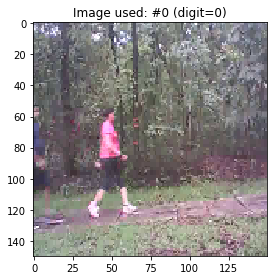

(148L, 148L, 32L)
Visualizing Convolutions Layer 0
The shape of each figures are
(1L,)


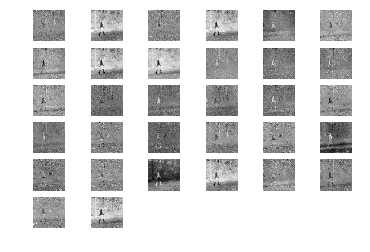

(72L, 72L, 32L)
Visualizing Convolutions Layer 1
The shape of each figures are
(1L,)


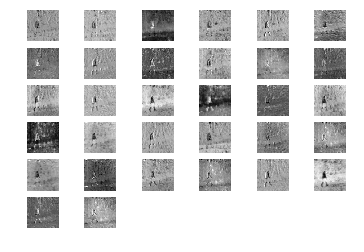

(34L, 34L, 32L)
Visualizing Convolutions Layer 2
The shape of each figures are
(1L,)


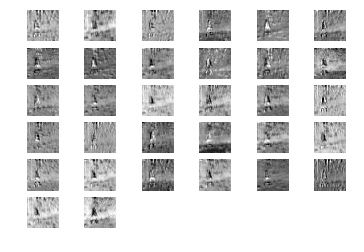

the img count  at each iteration is:
1


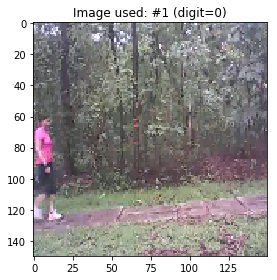

(148L, 148L, 32L)
Visualizing Convolutions Layer 0
The shape of each figures are
(1L,)


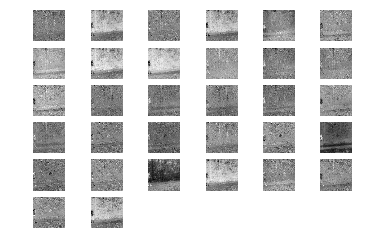

(72L, 72L, 32L)
Visualizing Convolutions Layer 1
The shape of each figures are
(1L,)


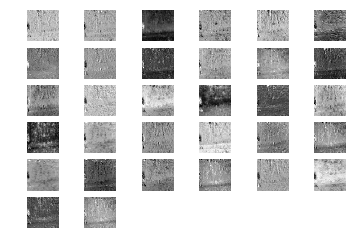

(34L, 34L, 32L)
Visualizing Convolutions Layer 2
The shape of each figures are
(1L,)


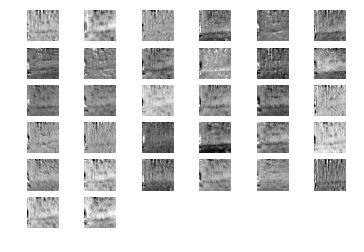

[0 1]
the img count  at each iteration is:
0


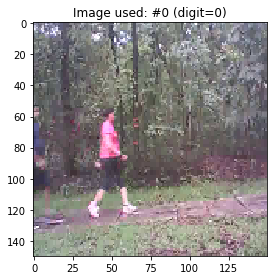

(74L, 74L, 32L)
Visualizing Convolutions Layer 0
The shape of each figures are
(1L,)


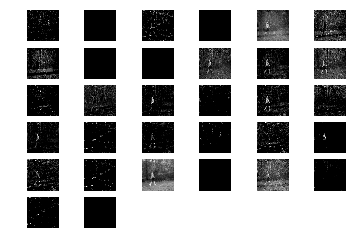

(36L, 36L, 32L)
Visualizing Convolutions Layer 1
The shape of each figures are
(1L,)


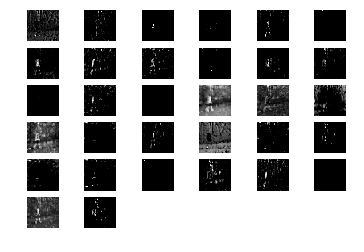

(17L, 17L, 32L)
Visualizing Convolutions Layer 2
The shape of each figures are
(1L,)


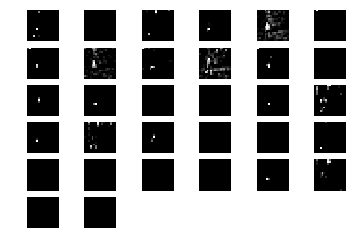

the img count  at each iteration is:
1


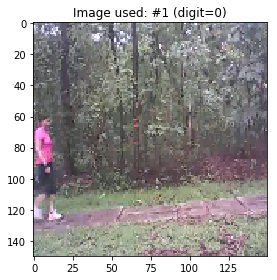

(74L, 74L, 32L)
Visualizing Convolutions Layer 0
The shape of each figures are
(1L,)


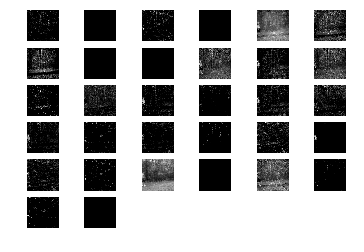

(36L, 36L, 32L)
Visualizing Convolutions Layer 1
The shape of each figures are
(1L,)


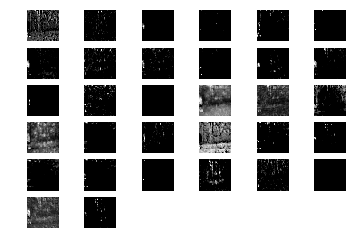

(17L, 17L, 32L)
Visualizing Convolutions Layer 2
The shape of each figures are
(1L,)


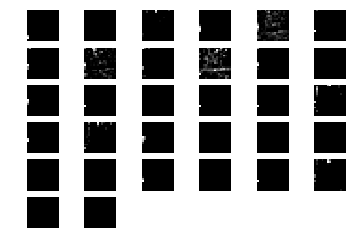

[0 1]
the img count  at each iteration is:
0


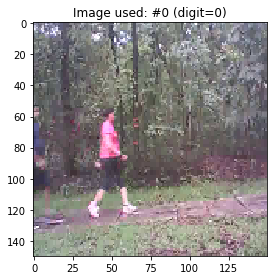

(148L, 148L, 32L)
Visualizing Convolutions Layer 0
The shape of each figures are
(1L,)


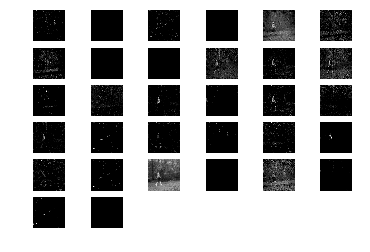

(72L, 72L, 32L)
Visualizing Convolutions Layer 1
The shape of each figures are
(1L,)


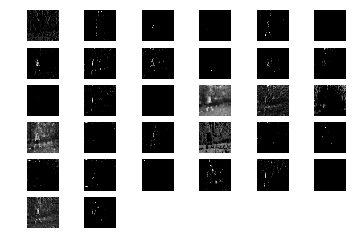

(34L, 34L, 32L)
Visualizing Convolutions Layer 2
The shape of each figures are
(1L,)


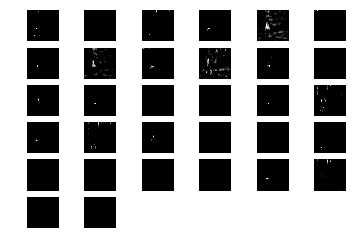

(64L,)
Visualizing Convolutions Layer 3


IndexError: too many indices for array

In [227]:
from math import sqrt

import matplotlib.pyplot as plt
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
NUM_LEAVES = 2
#model_fn = 'F:\\data\\updated_model_fine_tuned_version_1.h5'
model_fn = 'F:\\data\\updated_model_fine_tuned_version_Gender_ver_1.h5'

from PIL import Image
import numpy as np
#img = Image.open("F:\\data\\validation\\R_TO_L\\human13_0_2862.jpeg")
count_LR = 0
count_RL = 0
X_img_val = []
test_datagen = ImageDataGenerator(rescale=1. / 255,horizontal_flip=False)
validation_data_dir = 'F:\\data\\validation'
for i in range(19,21):
    img = Image.open("F:\\img_RGB\\women_"+str(i)+".png")
    rgb_im = img.convert('RGB')
    print rgb_im.size
    img_width, img_height = 150, 150
    imgvalue = rgb_im.resize((img_width,img_height))
    imgvalue = np.array(imgvalue.getdata()).reshape(imgvalue.size[0], imgvalue.size[1], 3)
#imgvalue = imgvalue.convert(mode='F')
    imgvalue =  imgvalue.astype('float32')
    imgNew = imgvalue/255
#imgNew = imgNew.transpose((2,0,1))
    imgval = np.expand_dims(imgNew,axis=0)      
    print imgval.shape                    
    numpy_img = np.array(imgval)
    X_img_val.append(numpy_img)
    LABELS = [1,1,1,1,1]
# Function by gcalmettes from http://stackoverflow.com/questions/11159436/multiple-figures-in-a-single-window
def plot_figures(figures, nrows = 1, ncols=1, titles=False):
    """Plot a dictionary of figures.

    Parameters
    ----------
    figures : <title, figure> dictionary
    ncols : number of columns of subplots wanted in the display
    nrows : number of rows of subplots wanted in the figure
    """
    plt.figure(figsize=[0,50])
    print "The shape of each figures are"
    print np.shape([figures])
    fig, axeslist = plt.subplots(ncols=ncols, nrows=nrows)
    for ind,title in enumerate(sorted(figures.keys(), key=lambda s: int(s[3:]))):
        axeslist.ravel()[ind].imshow(figures[title], cmap=plt.gray())
        if titles:
            axeslist.ravel()[ind].set_title(title)

    for ind in range(nrows*ncols):
        axeslist.ravel()[ind].set_axis_off()

    if titles:
        plt.tight_layout()
    plt.show()


def get_dim(num):
    """
    Simple function to get the dimensions of a square-ish shape for plotting
    num images
    """

    s = sqrt(num)
    if round(s) < s:
        return (int(s), int(s)+1)
    else:
        return (int(s)+1, int(s)+1)

# Load the best model
model = load_model(model_fn)
model.load_weights('F:\\data\\updated_weights_fine_tuned_version_Gender_ver_1.h5')
list_of_convolution_layers = []
validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

# Get the convolutional layers
array_of_all_layers = [Conv2D,MaxPooling2D,Activation]
for r in range(len(array_of_all_layers)):
    conv_layers = [layer for layer in model.layers if isinstance(layer, array_of_all_layers[r])]
 
    # Pick random images to visualize
    imgs_to_visualize = np.arange(0, len(X_img_val))
    imgs_to_visualize_list=list(imgs_to_visualize)
    #imgs_to_visualize = 1
    #imgs_to_visualize = range(1,6)
    #print imgs_to_visualize
    # Use a keras function to extract the conv layer data
    convout_func = K.function([model.layers[0].input, K.learning_phase()], [layer.output for layer in conv_layers])
    print convout_func
    #for k in range(len(imgs_to_visualize_list)):
    #    list_of_convolution_layers.append(convout_func([X_img_val[k], 0]))
    conv_imgs_filts = convout_func([X_img_val[imgs_to_visualize[0]], 0])

    # Also get the prediction so we know what we predicted
    #predictions = model.predict([X_img_val[imgs_to_visualize], X_num_val[imgs_to_visualize]])
    #print validation_generator.classes[imgs_to_visualize]
    #predictions = model.predict([X_img_val[imgs_to_visualize],validation_generator.classes[imgs_to_visualize]])
    #predictions = model.predict(X_img_val[imgs_to_visualize])

    imshow = plt.imshow #alias
    print imgs_to_visualize
    # Loop through each image disply relevant info
    for img_count, img_to_visualize in enumerate(imgs_to_visualize):
        print "the img count  at each iteration is:"
        print img_count
        actual = validation_generator.classes[img_to_visualize]
        # Show the original image
        plt.title("Image used: #%d (digit=%d)" % (img_to_visualize, validation_generator.classes[img_to_visualize]))
        # For Theano users comment the line below and
        #imshow(X_img_val[img_to_visualize][:, :, 0],cmap='nipy_spectral')
        imshow(X_img_val[img_to_visualize][0], cmap='gray') # uncomment this
        plt.tight_layout()
        plt.show()

        # Plot the filter images
        """for i, conv_imgs_filt in enumerate(list_of_convolution_layers):
        #print conv_imgs_filt
        conv_img_filt = conv_imgs_filt[img_count]
        
        print("Visualizing Convolutions Layer %d" % i)
        
        # Get it ready for the plot_figures function
        # For Theano users comment the line below and
        #fig_dict = {'flt{0}'.format(i): conv_img_filt[:, :, i] for i in range(conv_img_filt.shape[-1])}
        fig_dict = {'flt{0}'.format(i): conv_img_filt[i] for i in range(conv_img_filt.shape[-1])} # uncomment this
        plot_figures(fig_dict, *get_dim(len(fig_dict)))"""
        conv_imgs_filts = convout_func([X_img_val[img_to_visualize], 0])
        #print np.shape([conv_imgs_filts])
        for i, conv_imgs_filt in enumerate(conv_imgs_filts):
            
            #print conv_imgs_filt
            print np.shape(conv_imgs_filt[0])
            conv_img_filt = conv_imgs_filt[0]
        
            print("Visualizing Convolutions Layer %d" % i)
        
            # Get it ready for the plot_figures function
            # For Theano users comment the line below and
            fig_dict = {'flt{0}'.format(i): conv_img_filt[:, :, i] for i in range(conv_img_filt.shape[-1])}
            #fig_dict = {'flt{0}'.format(i): conv_img_filt[i] for i in range(conv_img_filt.shape[-1])} # uncomment this
            plot_figures(fig_dict, *get_dim(len(fig_dict)))

In [211]:
np.random.choice(np.arange(1, len(X_img_val), NUM_LEAVES))

3

In [23]:
model = load_model(model_fn)
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_19 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
activation_31 (Activation)   (None, 148, 148, 32)      0         
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 72, 72, 32)        9248      
_________________________________________________________________
activation_32 (Activation)   (None, 72, 72, 32)        0         
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 34, 34, 32)        9248      
__________

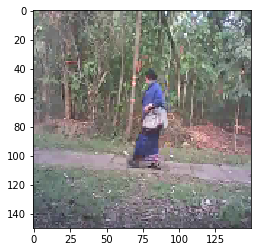

In [377]:
import numpy as np

from matplotlib import pyplot as plt
%matplotlib inline

#from model import build_model, FRAME_W, FRAME_H
from keras.preprocessing.image import img_to_array
from vis.utils import utils
FRAME_H,FRAME_W = 150,150
model = load_model(model_fn)
model.load_weights('F:\\data\\updated_weights_fine_tuned_version_Gender_ver_1.h5')
img = utils.load_img("F:\\img_RGB\\women_"+str(2)+".png", target_size=(FRAME_H, FRAME_W))
plt.imshow(img)

In [378]:
bgr_img = utils.bgr2rgb(img)
img_input = np.expand_dims(img_to_array(bgr_img), axis=0)
pred = model.predict(img_input)[0][0]
print('Predicted {}'.format(pred))

Predicted 0.0


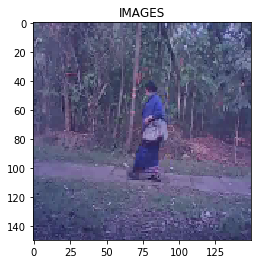

In [379]:
from vis.visualization import visualize_saliency, overlay

titles = ['IMAGES']
modifiers = ['small_values']
for i, modifier in enumerate(modifiers):
    heatmap = visualize_saliency(model, layer_idx=-1, filter_indices=0, 
                                 seed_input=bgr_img, grad_modifier=modifier)
    plt.figure()
    plt.title(titles[i])
    # Overlay is used to alpha blend heatmap onto img.
    plt.imshow(overlay(img, heatmap, alpha=0.7))

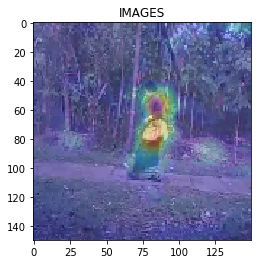

In [380]:
from vis.visualization import visualize_cam

for i, modifier in enumerate(modifiers):
    heatmap = visualize_cam(model, layer_idx=-1, filter_indices=0, 
                            seed_input=bgr_img, grad_modifier=modifier)
    plt.figure()
    plt.title(titles[i])
    # Overlay is used to alpha blend heatmap onto img.
    plt.imshow(overlay(img, heatmap, alpha=0.7))

In [26]:
imgs_to_visualize = np.random.choice(np.arange(0, 20, 3))

In [183]:
imgs_to_visualize = imgs_to_visualize.flatten()
np.shape([imgs_to_visualize])

(1L, 4L)

In [56]:
np.random.choice(np.arange(0, 6, 3))

3

In [7]:
from keras.preprocessing.image import ImageDataGenerator
validation_data_dir = 'F:\\data\\validation'
img_width, img_height = 150, 150
train_data_dir = 'F:\\data\\train'
validation_data_dir = 'F:\\data\\validation'
nb_train_samples = 1661
nb_validation_samples = 414
epochs = 25
batch_size = 20

test_datagen = ImageDataGenerator(rescale=1. / 255,horizontal_flip=False)
validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')


print validation_generator.samples

Found 414 images belonging to 2 classes.
414


In [49]:
while True:
    num_recs = validation_generator.samples
    indices = np.random.permutation(np.arange(num_recs))
    num_batches = num_recs // batch_size
    for bid in range(num_batches):
        # loop once per batch
        batch_indices = indices[bid * batch_size : (bid + 1) * batch_size]
        batch = [image_triples[i] for i in batch_indices]
        # make sure image data generators generate same transformations
        seed = np.random.randint(low=0, high=1000, size=1)[0]
        Xleft = preprocess_images([b[0] for b in batch], seed, 
                                      datagen_left, image_cache)
        Xright = preprocess_images([b[1] for b in batch], seed,
                                       datagen_right, image_cache)
        Y = np_utils.to_categorical(np.array([b[2] for b in batch]))
        print Xleft[0], Xright[0], Y[0]
        print np.shape(Xleft[0]),np.shape(Xright[0]),np.shape(Y[0])
        print np.shape(Xleft),np.shape(Xright),np.shape(Y)

NameError: name 'image_triples' is not defined

In [216]:
array_of_all_layers = [MaxPooling2D,Activation,Conv2D]

In [219]:
array_of_all_layers[2]

keras.layers.convolutional.Conv2D

In [238]:
model = load_model(model_fn)
model.load_weights('F:\\data\\updated_weights_fine_tuned_version_Gender_ver_1.h5')
layer_dict = dict([(layer.name, layer) for layer in model.layers])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
activation_24 (Activation)   (None, 148, 148, 32)      0         
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 72, 72, 32)        9248      
_________________________________________________________________
activation_25 (Activation)   (None, 72, 72, 32)        0         
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 34, 34, 32)        9248      
__________

In [245]:
img = Image.open("F:\\img_RGB\\human_"+str(11)+".png")
rgb_im = img.convert('RGB')
print rgb_im.size
img_width, img_height = 150, 150
imgvalue = rgb_im.resize((img_width,img_height))
imgvalue = np.array(imgvalue.getdata()).reshape(imgvalue.size[0], imgvalue.size[1], 3)
#imgvalue = imgvalue.convert(mode='F')
imgvalue =  imgvalue.astype('float32')
imgNew = imgvalue/255
#imgNew = imgNew.transpose((2,0,1))
imgval = np.expand_dims(imgNew,axis=0)      
print imgval.shape                    
numpy_img = np.array(imgval)

(640, 480)
(1L, 150L, 150L, 3L)


In [246]:
from keras import backend as K

layer_name = 'max_pooling2d_18'
filter_index = 0  # can be any integer from 0 to 511, as there are 512 filters in that layer
input_img = model.input
# build a loss function that maximizes the activation
# of the nth filter of the layer considered
layer_output = layer_dict[layer_name].output
loss = K.mean(layer_output[:, :, :, filter_index])

# compute the gradient of the input picture wrt this loss
grads = K.gradients(loss, input_img)[0]

# normalization trick: we normalize the gradient
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

# this function returns the loss and grads given the input picture
iterate = K.function([input_img], [loss, grads])

In [253]:
import numpy as np
step=5
# we start from a gray image with some noise
input_img_data = np.random.random((1,img_width,img_height,3)) * 20 + 128.
# run gradient ascent for 20 steps
for i in range(50):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

In [254]:
from scipy.misc import imsave

# util function to convert a tensor into a valid image
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = x.transpose((1,0,2))
    x = np.clip(x, 0, 255).astype('uint8')
    return x

img = input_img_data[0]
img = deprocess_image(img)
print np.shape(img)
plt.imshow(img)
imsave('%s_filter1_%d.png' % (layer_name, filter_index), img)

(150L, 150L, 3L)


In [176]:
np.random.choice(np.arange(0,len(X_img_val)),5)

array([2, 1, 1, 0, 1])

In [170]:
len(X_img_val)

3

In [175]:
np.arange(0,5,2)

array([0, 2, 4])